#Часть 1
Полностью самостоятельно загрузить картинки у меня не получилось, 
так что обратился к ноутбуку с объяснениями

In [0]:
import numpy as np
import cv2
import pandas as pd

In [0]:
import os
from scipy.misc import imread,imresize

def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: imresize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos, all_attrs

In [3]:
all_photos, all_attrs = fetch_dataset()

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [0]:
import matplotlib.pyplot as plt

In [0]:
train_ph=all_photos[:10143]
val_ph=all_photos[10143:]

In [0]:
def generator(gen_df, batch_size, prt=False):
    while True:
        x_batch = []
        y_batch = []
        c=0
        
        for i in range(batch_size):
            c+=1
            img = gen_df[c]
            
            img = cv2.resize(img, (256, 256))
            
            if prt and c%10==0:
              plt.imshow(img)
            
            x_batch += [img]
            y_batch += [img]

        x_batch = np.array(x_batch) / 255.
        y_batch = np.array(y_batch) /255.

        yield x_batch, y_batch

#Надо было подобрать картинки, 
так что ещё пара EDA-ячеек в итоговом ноутбуке модели

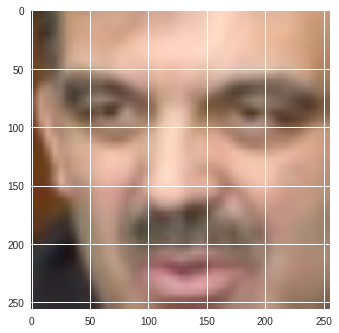

In [135]:
plt.imshow(cv2.resize(train_ph[36], (256, 256,))) #[1, 3, 4, 5, 6, 8, 9, 11, 26, 31, 101, 34, 58, 60, 83]

0


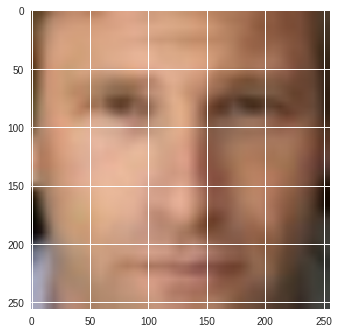

1


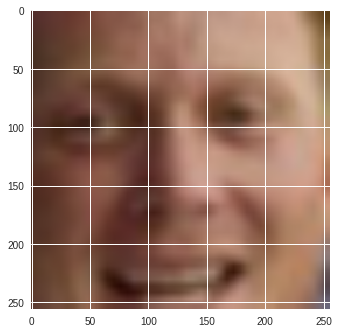

2


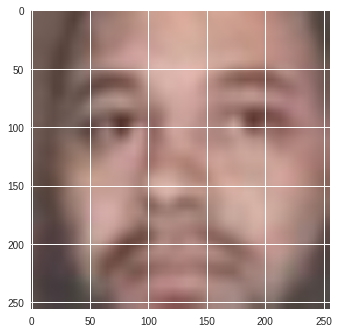

3


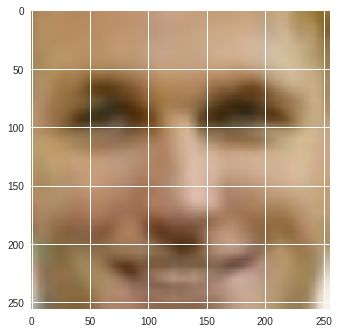

4


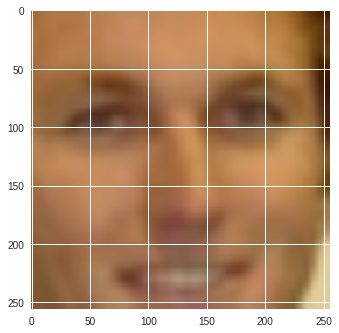

5


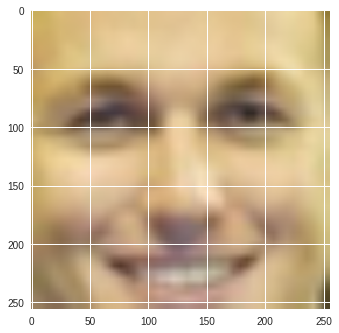

6


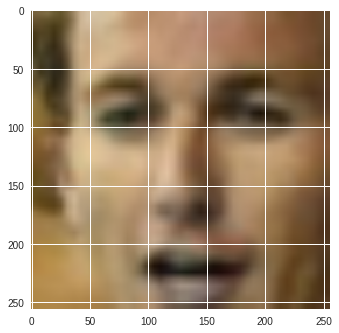

7


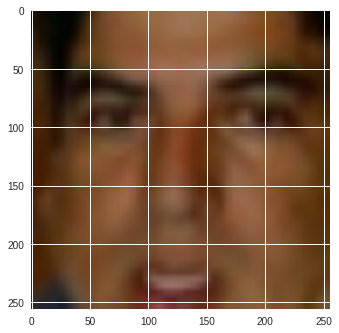

8


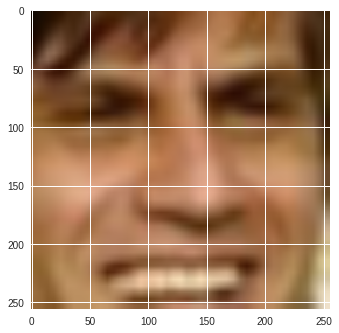

9


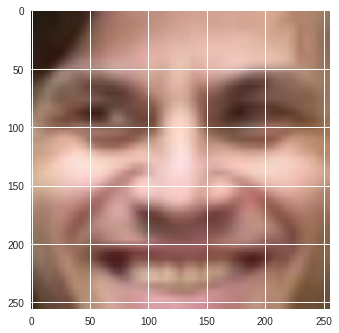

10


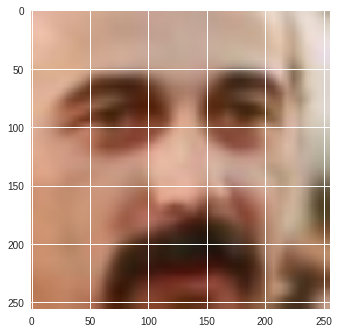

11


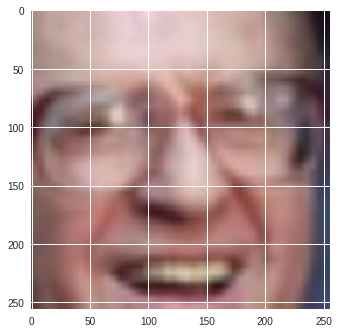

12


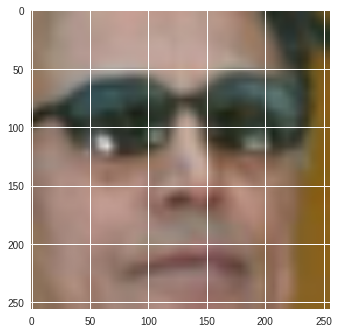

13


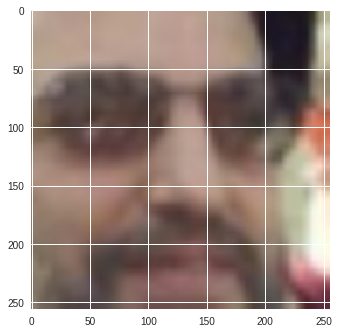

14


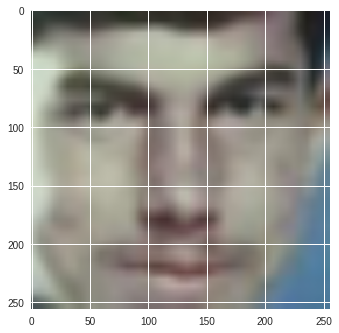

15


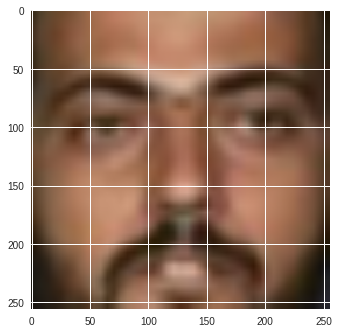

16


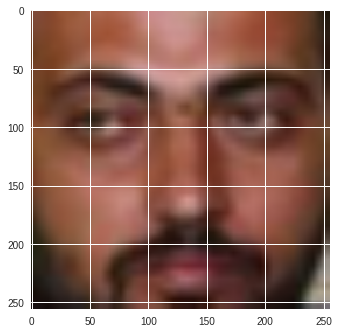

17


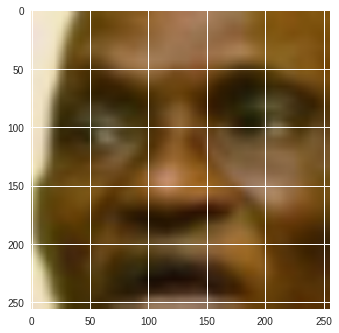

18


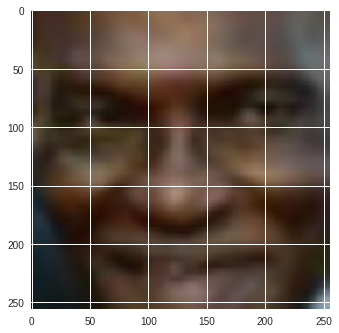

19


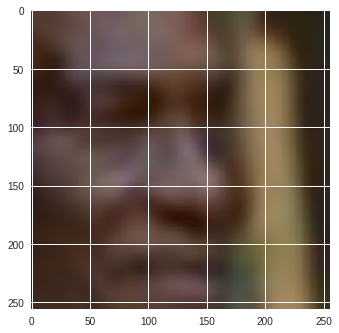

20


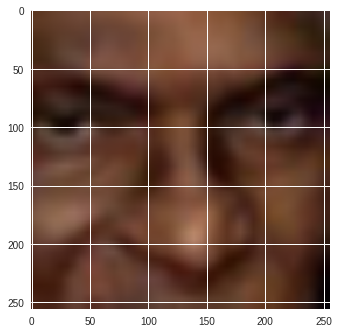

21


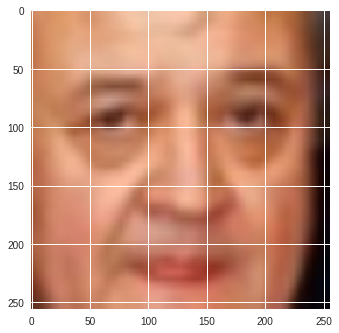

22


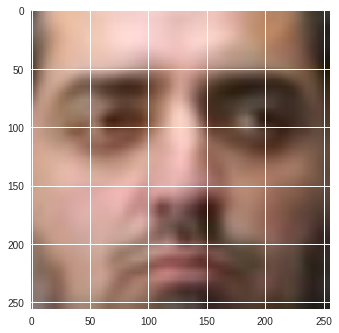

23


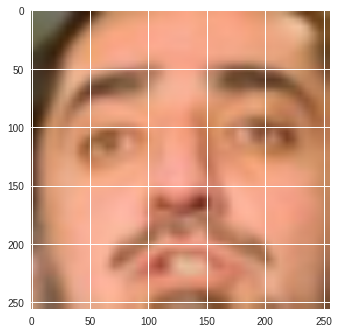

24


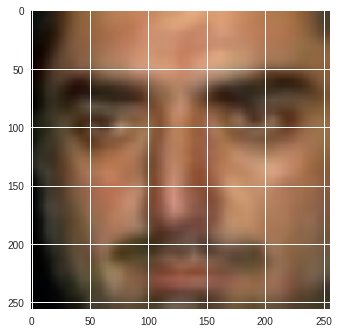

25


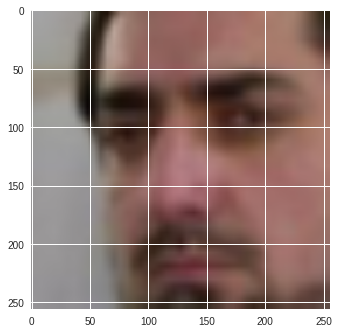

26


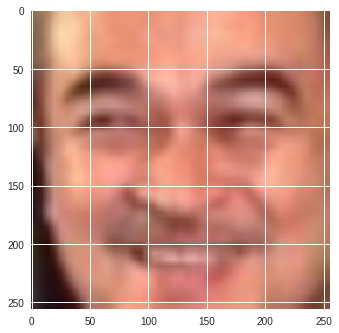

27


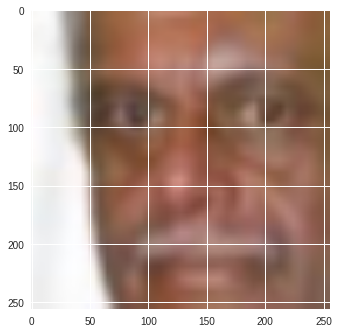

28


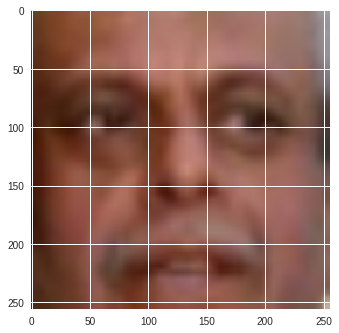

29


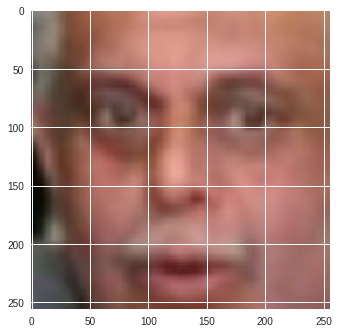

30


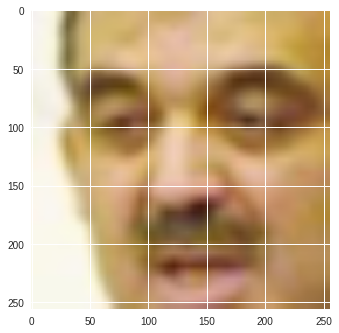

31


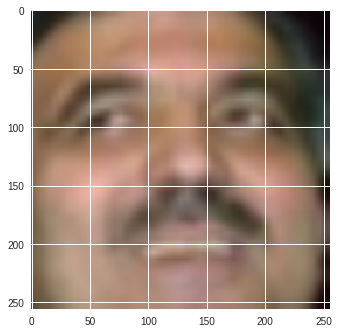

32


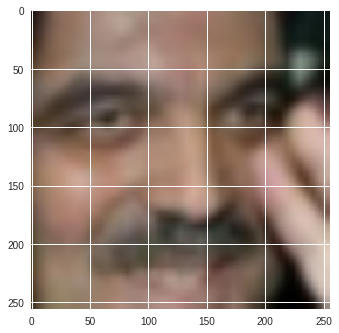

33


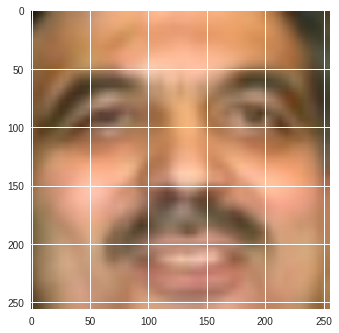

34


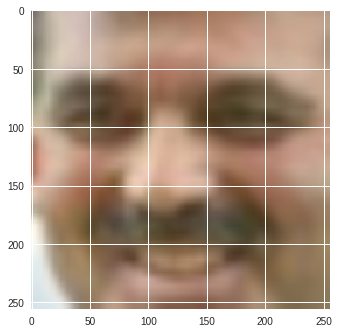

35


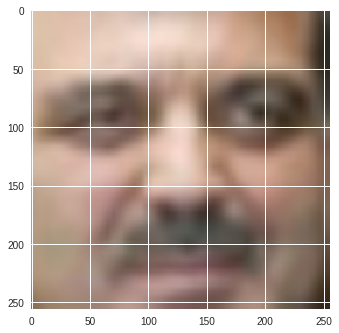

36


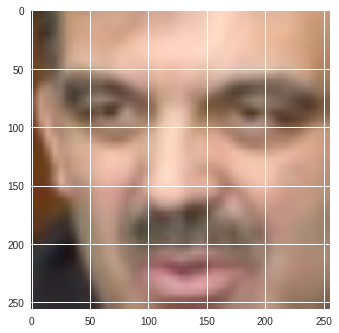

37


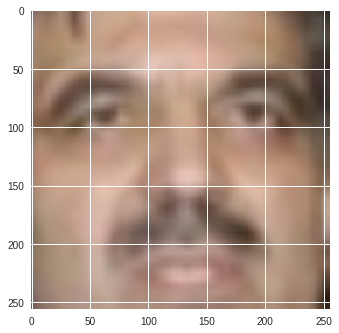

38


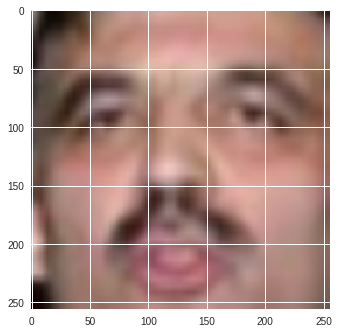

39


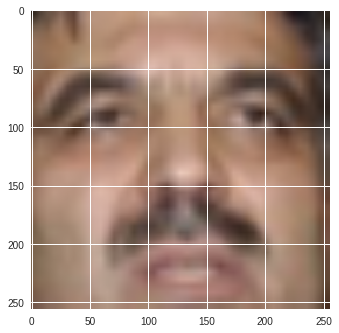

40


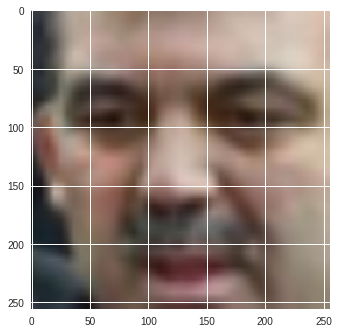

41


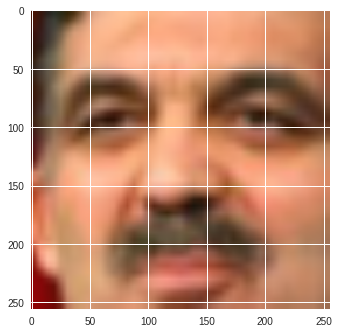

42


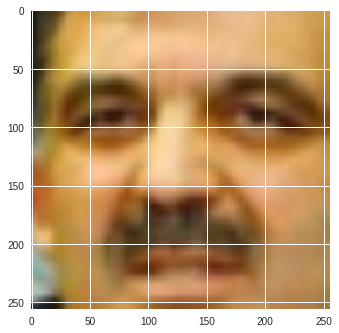

43


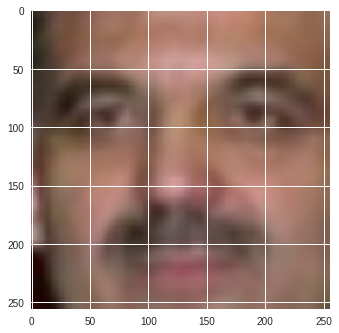

44


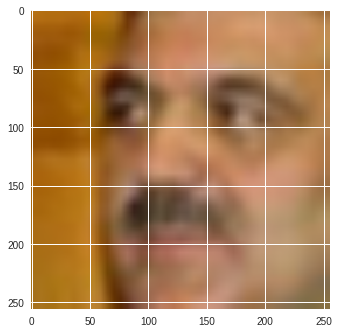

45


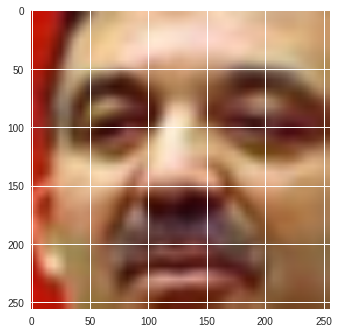

46


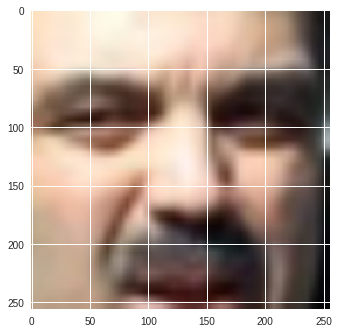

47


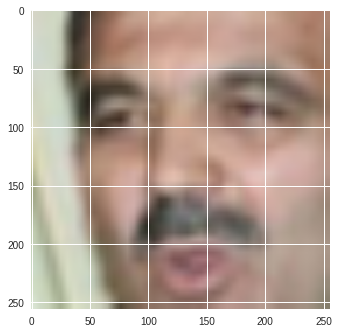

48


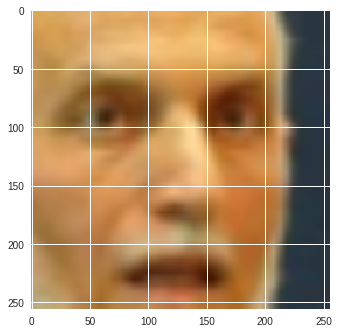

49


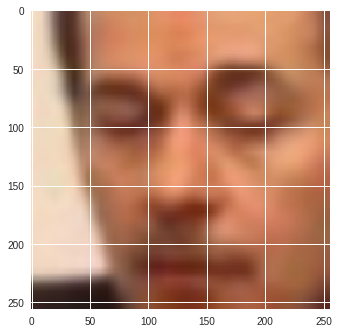

50


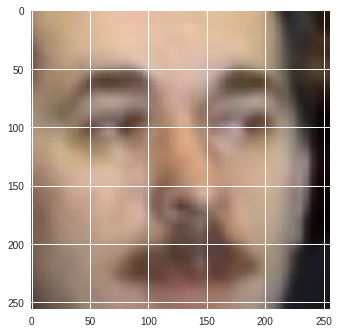

51


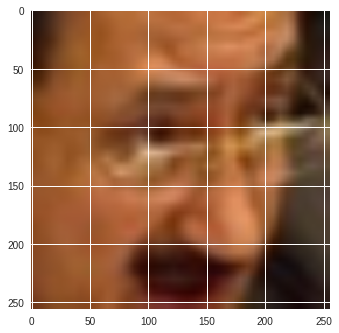

52


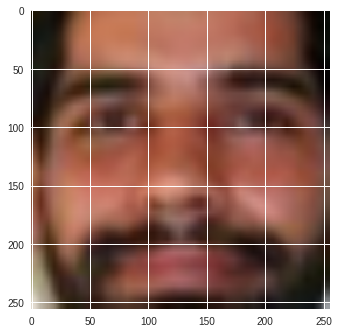

53


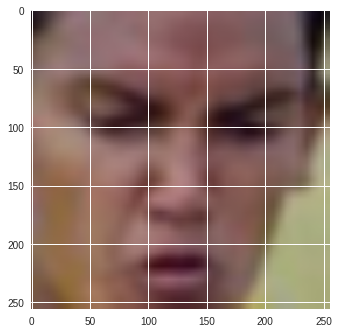

54


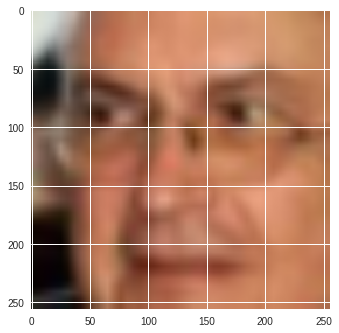

55


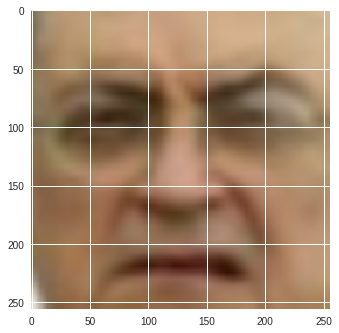

56


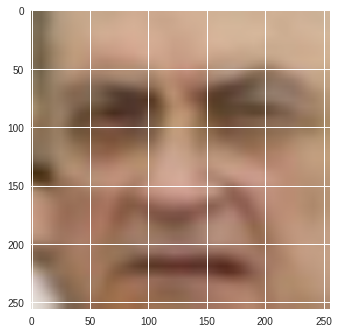

57


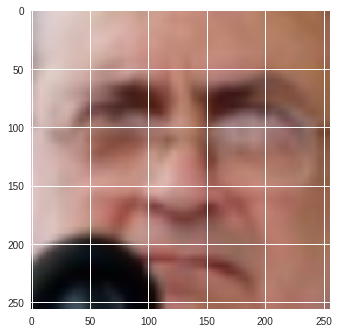

58


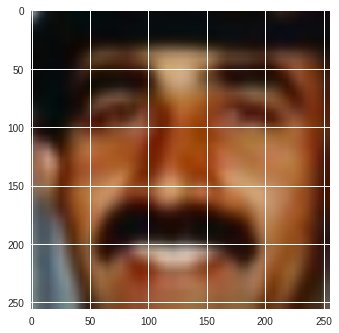

59


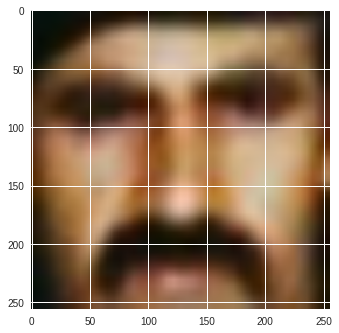

60


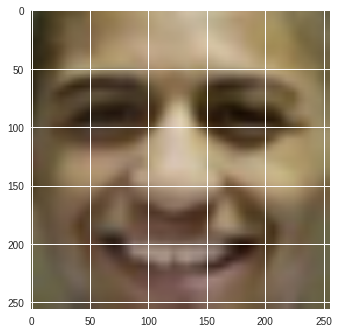

61


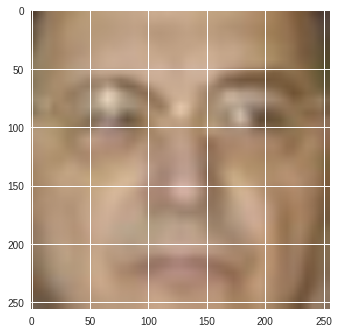

62


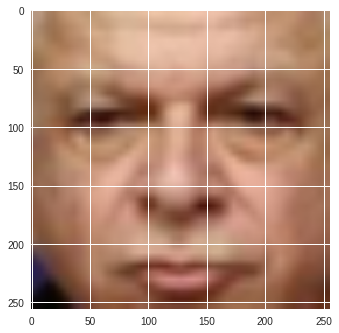

63


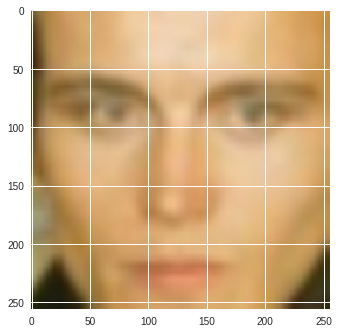

64


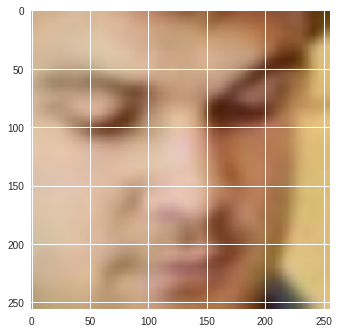

65


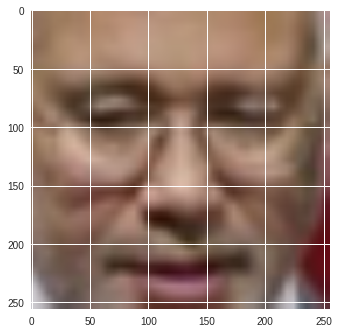

66


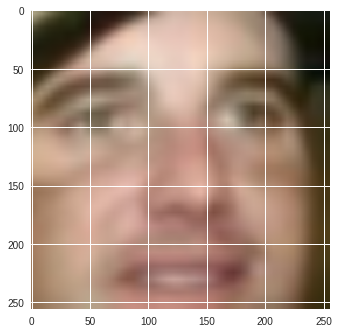

67


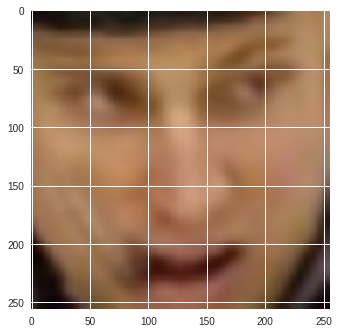

68


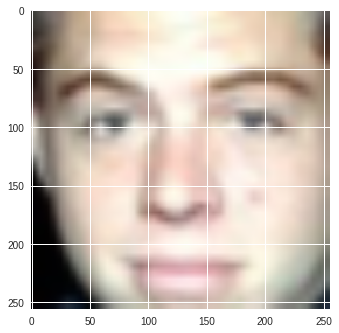

69


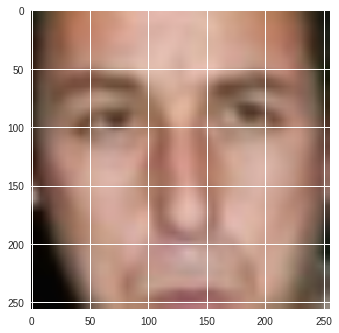

70


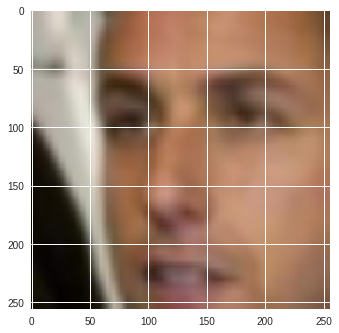

71


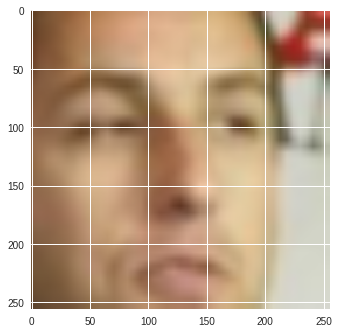

72


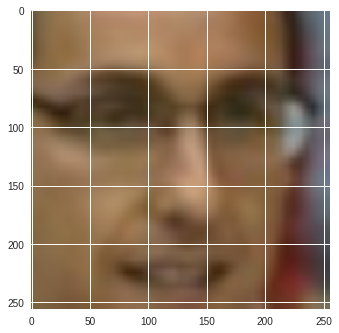

73


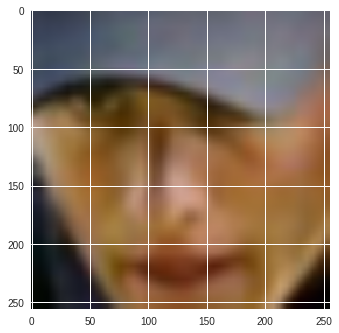

74


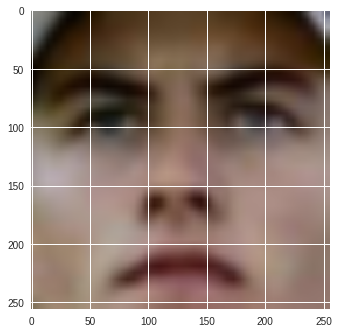

75


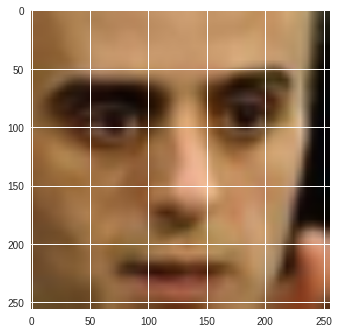

76


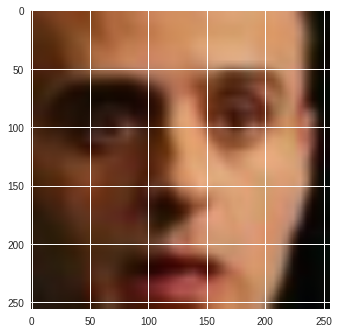

77


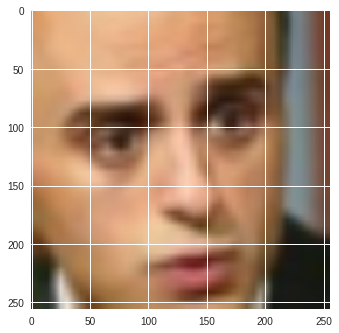

78


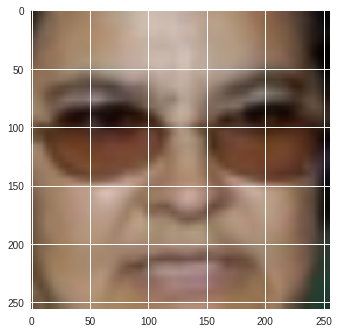

79


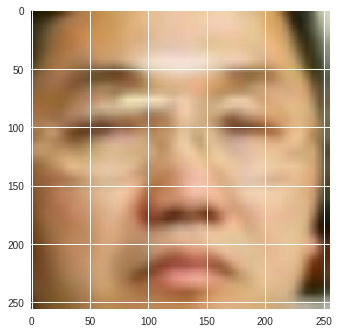

80


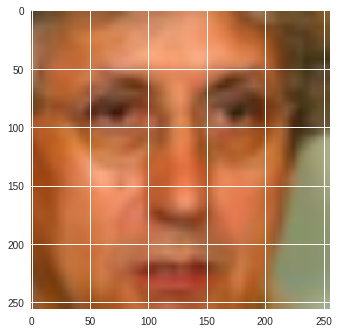

81


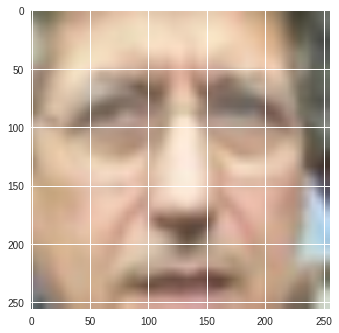

82


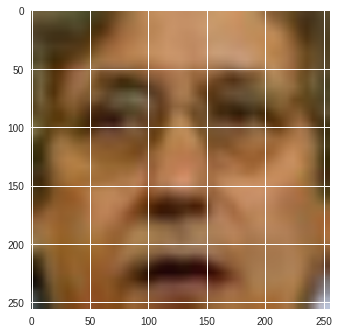

83


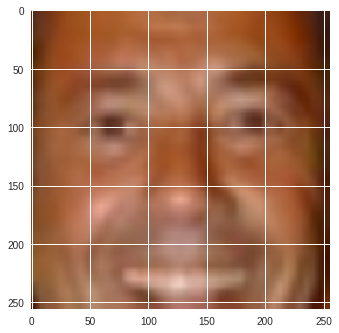

84


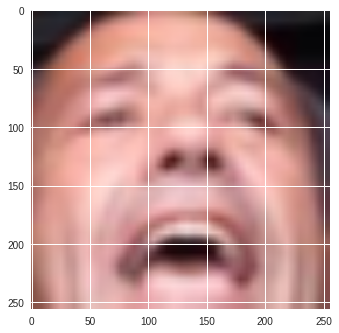

85


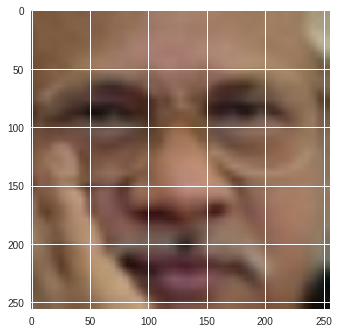

86


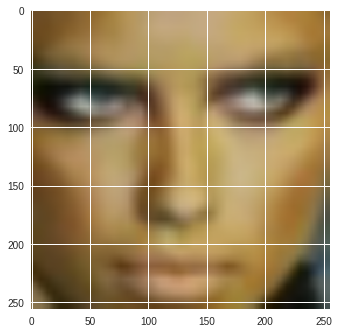

87


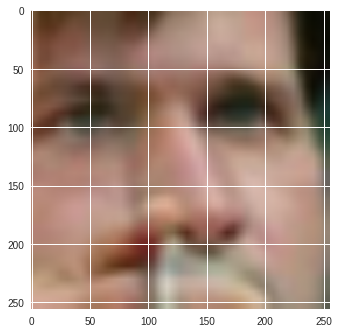

88


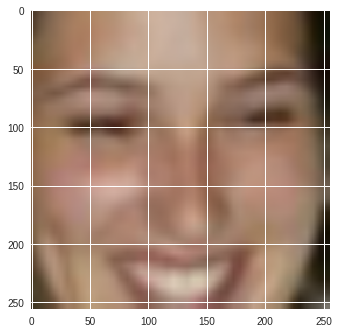

89


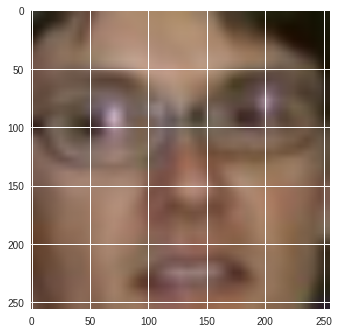

90


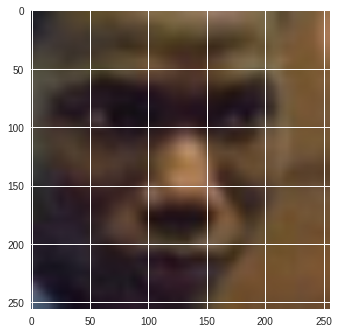

91


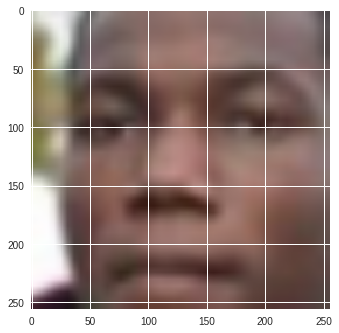

92


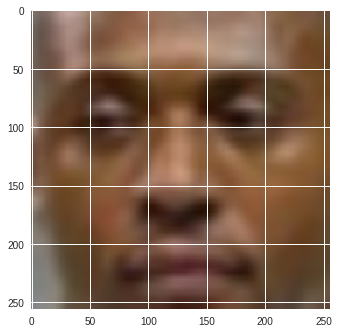

93


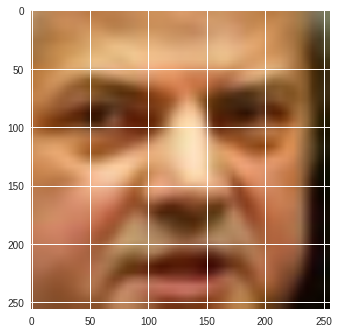

94


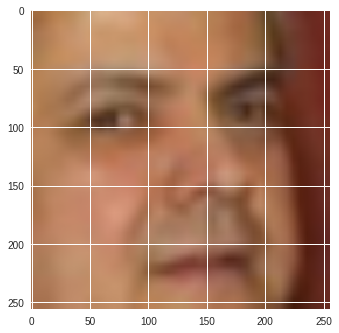

95


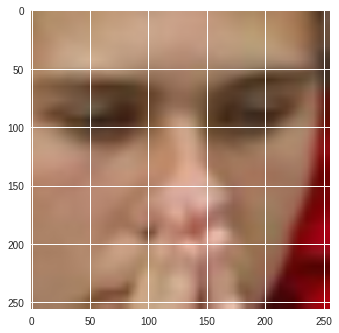

96


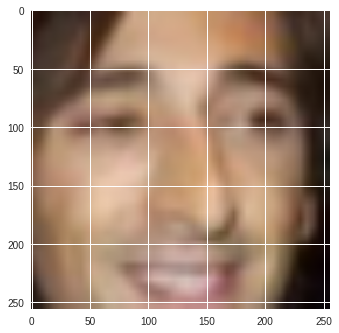

97


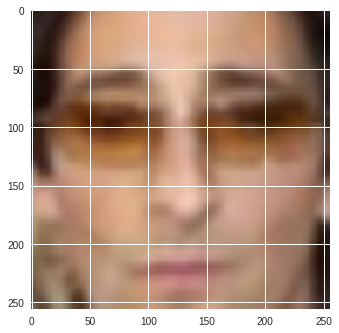

98


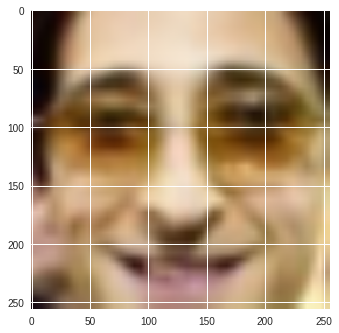

99


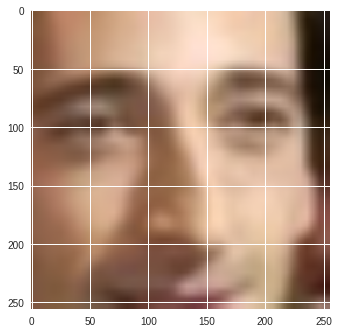

100


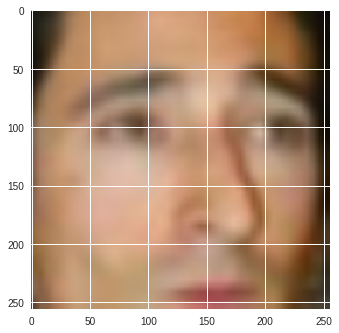

101


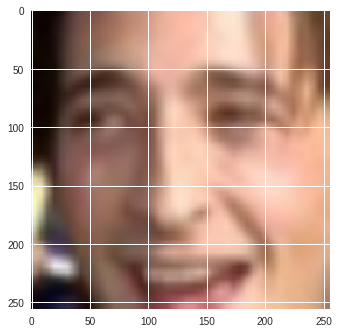

102


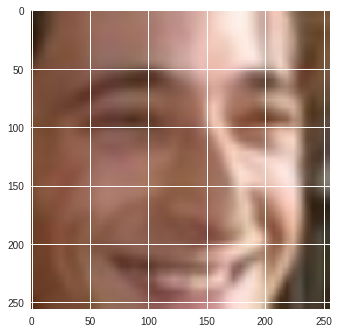

103


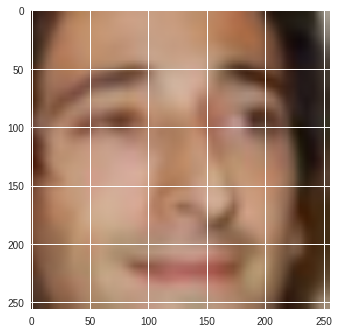

104


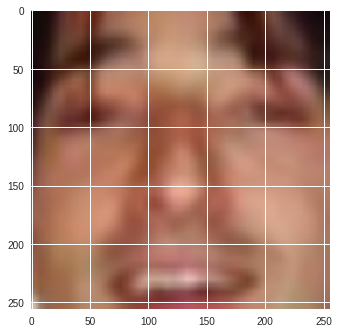

105


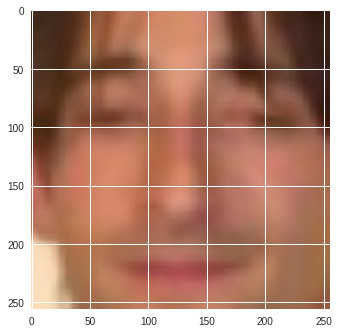

106


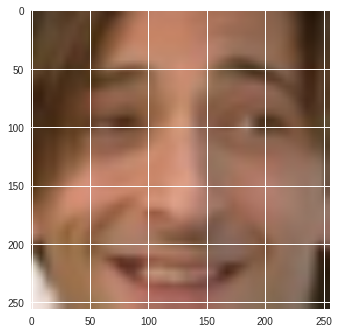

107


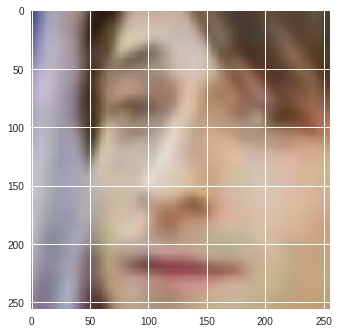

108


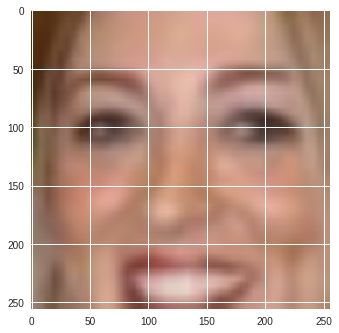

109


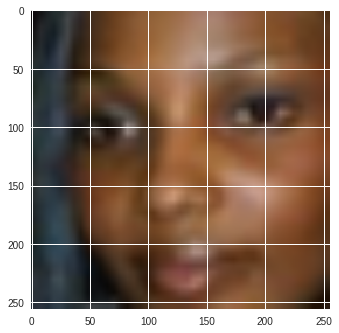

110


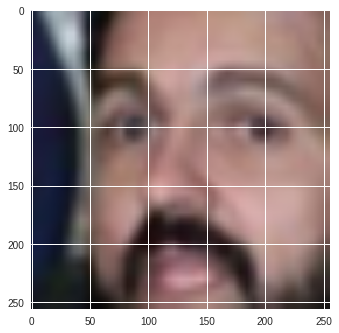

111


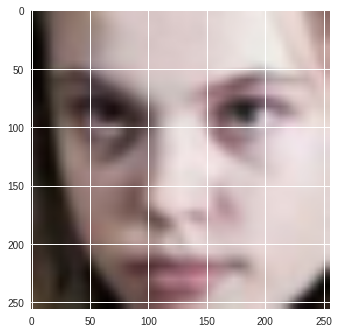

112


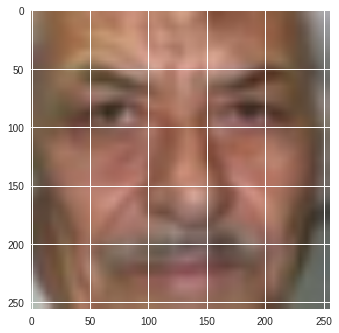

113


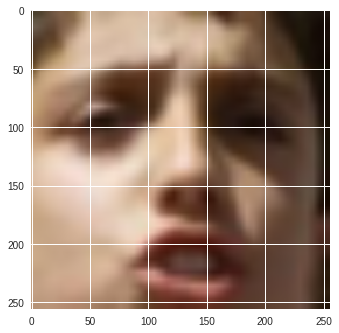

114


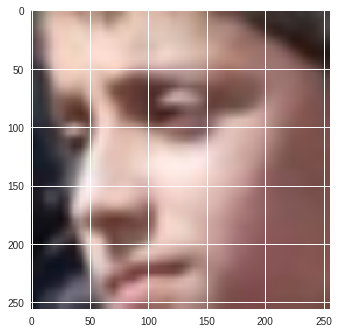

115


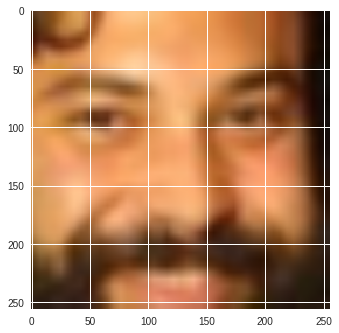

116


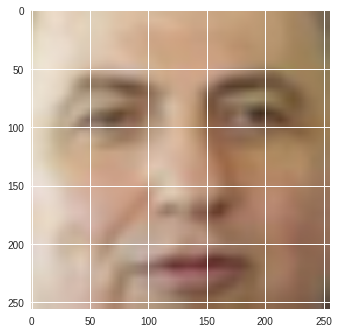

117


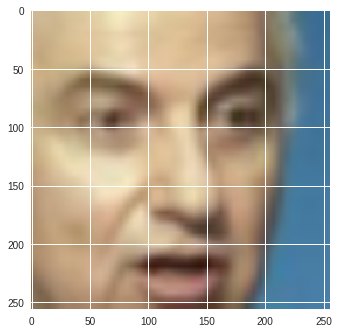

118


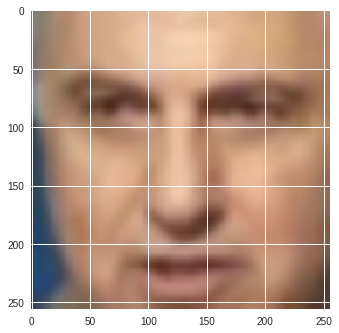

119


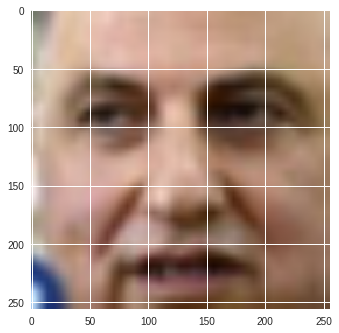

120


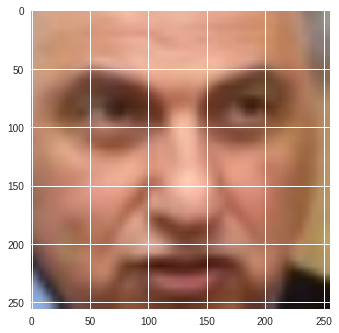

121


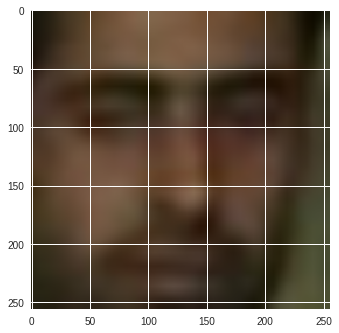

122


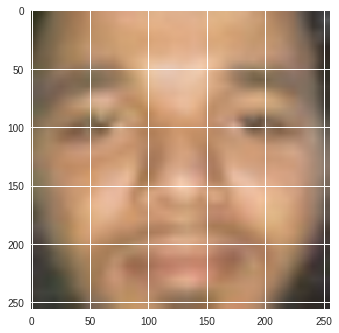

123


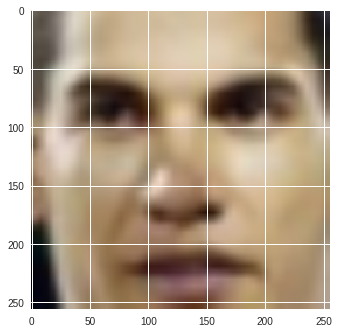

124


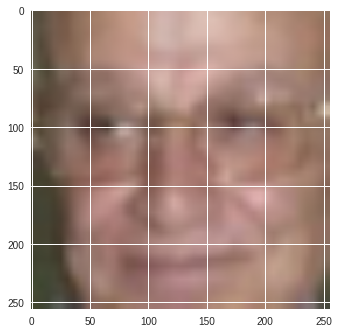

125


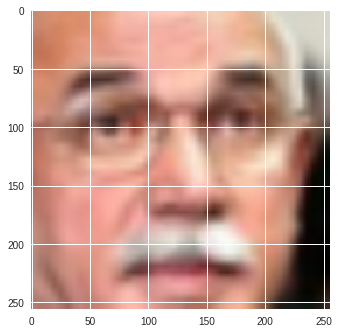

126


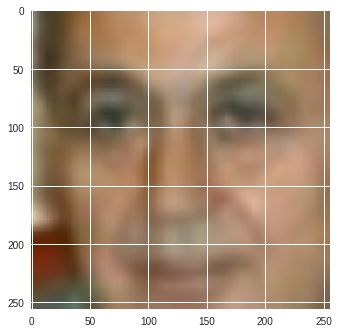

127


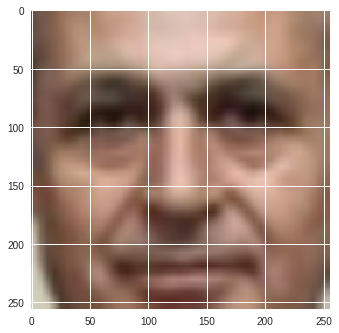

128


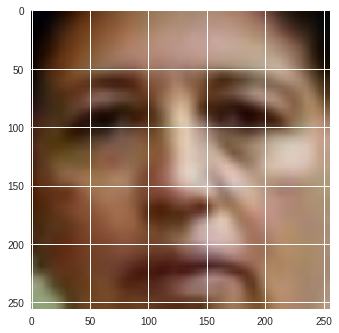

129


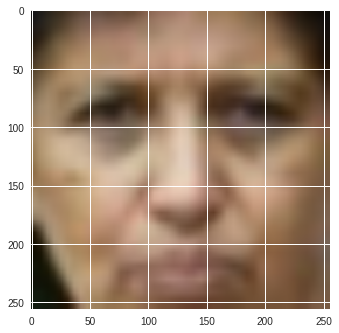

130


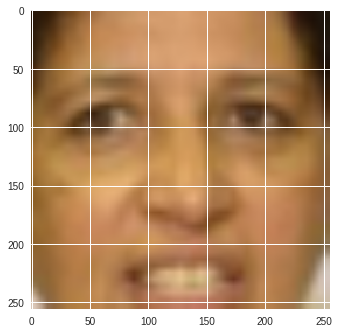

131


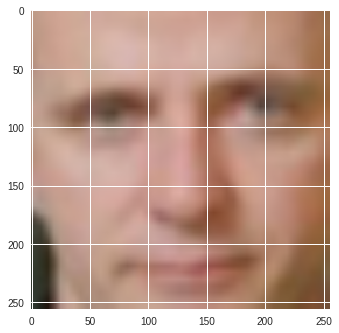

132


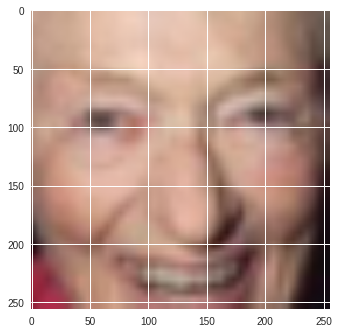

133


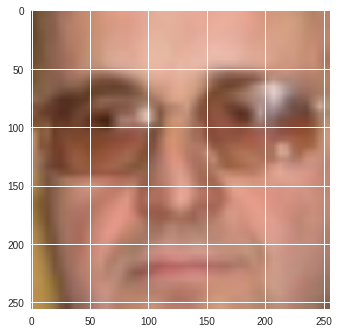

134


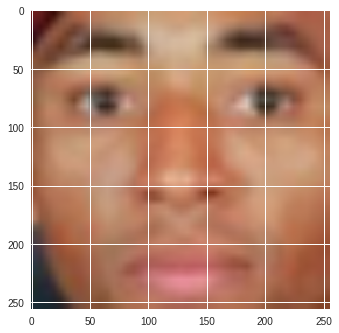

135


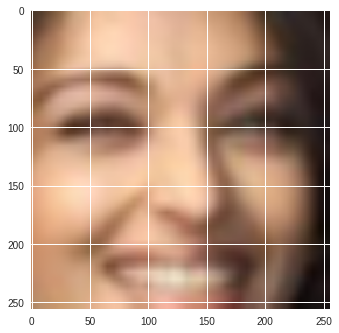

136


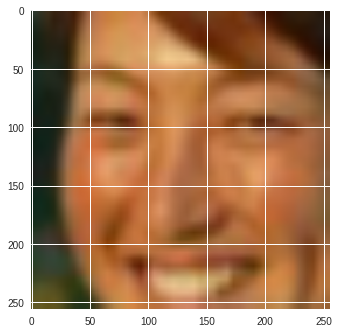

137


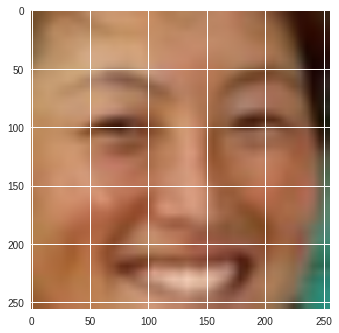

138


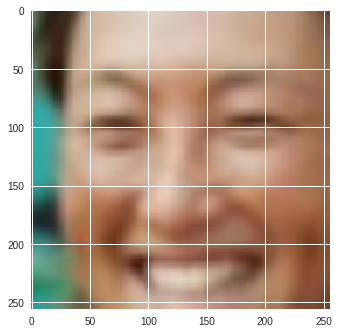

139


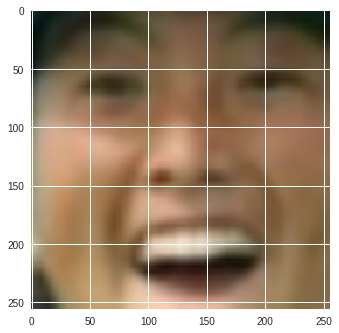

140


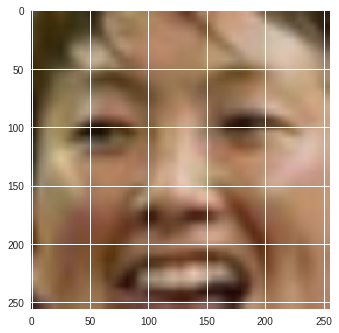

141


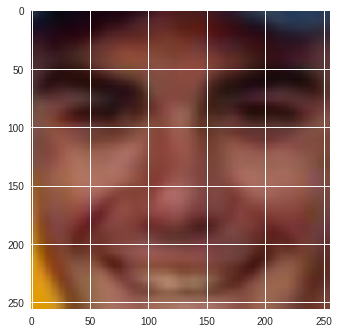

142


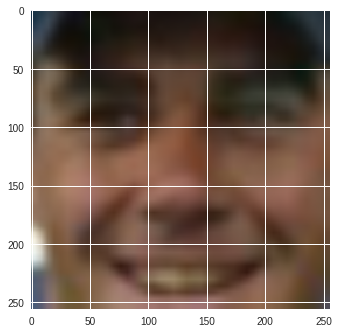

143


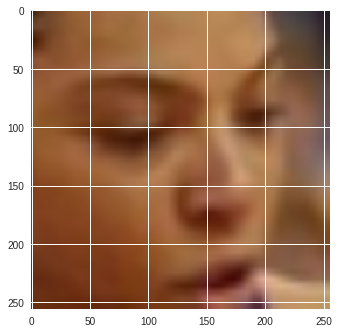

144


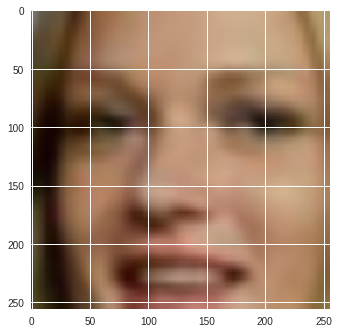

145


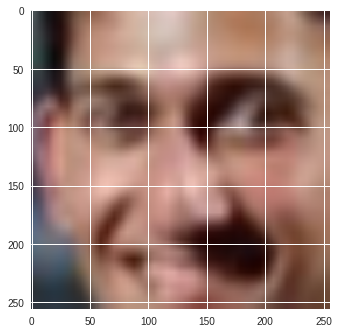

146


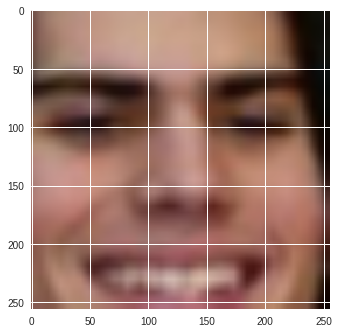

147


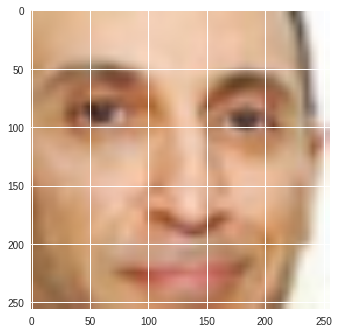

148


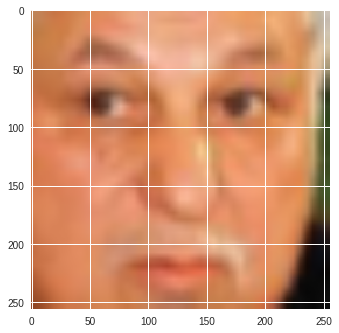

149


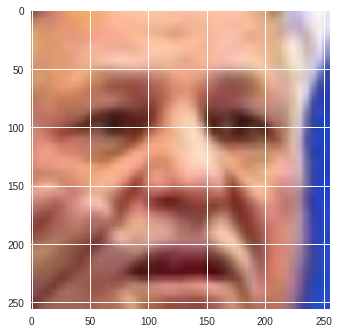

In [50]:
for i in range(150):
  print(i)
  plt.imshow(cv2.resize(train_ph[i], (256, 256,)))
  plt.show()
  #[1, 3, 4, 5, 6, 8, 9, 11, 26, 31, 101, 34, 58, 60, 83]
  #[21, 0, 49, 0, 56, 35, 62, 117, 29, 35, 107, 45, 59, 126, 80]

#Часть 2
Пишем автоэнкодер

In [0]:
import keras
from keras.layers import MaxPooling2D, Conv2D, Activation, Input, UpSampling2D
from keras.models import Model, Sequential

In [0]:
base_in = Input(shape = (256, 256, 3))
conv_0=Conv2D(32, (3, 3), padding = 'same', activation='relu')(base_in)


conv_1=Conv2D(32, (3, 3), padding = 'same', activation='relu')(conv_0)

pool_0 = MaxPooling2D(2)(conv_1)

################################

conv_2=Conv2D(64, (3, 3), padding = 'same', activation='relu')(pool_0)


conv_3=Conv2D(64, (3, 3), padding = 'same', activation='relu')(conv_2)

pool_1 = MaxPooling2D(2)(conv_3)

################################

conv_4=Conv2D(128, (3, 3), padding = 'same', activation='relu')(pool_1)


conv_5=Conv2D(128, (3, 3), padding = 'same', activation='relu')(conv_4)

pool_2 = MaxPooling2D(2)(conv_5)

################################

conv_6=Conv2D(256, (3, 3), padding = 'same', activation='relu')(pool_2)


conv_7=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_6)


pool_3 = MaxPooling2D(2)(conv_7)

################################

up_0=UpSampling2D(2, interpolation='bilinear')(pool_3)

conv_up_0=Conv2D(256, (3, 3), padding = 'same', activation='relu')(up_0)


conv_up_1=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_up_0)


#################

up_1=UpSampling2D(2, interpolation='bilinear')(conv_up_1)

conv_up_3=Conv2D(128, (3, 3), padding = 'same', activation='relu')(up_1)


conv_up_4=Conv2D(128, (3, 3), padding = 'same', activation='relu')(conv_up_3)

#################

up_2=UpSampling2D(2, interpolation='bilinear')(conv_up_4)

conv_up_5=Conv2D(64, (3, 3), padding = 'same', activation='relu')(up_2)


conv_up_6=Conv2D(64, (3, 3), padding = 'same', activation='relu')(conv_up_5)

#################

up_3=UpSampling2D(2, interpolation='bilinear')(conv_up_6)

conv_up_7=Conv2D(32, (3, 3), padding = 'same', activation='relu')(up_3)


conv_up_8=Conv2D(1, (3, 3), padding = 'same', activation='relu')(conv_up_7)


out=Conv2D(3, (3, 3), padding='same', activation='sigmoid')(conv_up_8)


autoencoder = Model(inputs=base_in, outputs=out)

In [0]:
best_w = keras.callbacks.ModelCheckpoint('autoenc_best.h5',
                                monitor='val_loss',
                                verbose=0,
                                save_best_only=True,
                                save_weights_only=True,
                                mode='auto',
                                period=1)

last_w = keras.callbacks.ModelCheckpoint('autoenc_last.h5',
                                monitor='val_loss',
                                verbose=0,
                                save_best_only=False,
                                save_weights_only=True,
                                mode='auto',
                                period=1)


callbacks = [best_w, last_w]



adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)


autoencoder.compile(adam, 'binary_crossentropy')

#И вот тут (наконец-то) воникли проблемы
Сеть обучалась *дико* медленно, а сам colab постоянно терял рантайм. Поэтому остальное я писал без наличия натренированного автоэнкодера

In [0]:
batch_size = 16
autoencoder.fit_generator(generator(train_ph, batch_size),
              steps_per_epoch=100,
              epochs=15,
              verbose=1,
              callbacks=callbacks,
              validation_data=generator(val_ph, batch_size, True),
              validation_steps=50,
              class_weight=None,
              max_queue_size=10,
              workers=1,
              use_multiprocessing=False,
              shuffle=True,
              initial_epoch=0)

Epoch 1/15
100/100 [==============================] - 3051s 31s/step - loss: 0.6736 - val_loss: 0.6755
Epoch 2/15
  4/100 [>.............................] - ETA: 43:06 - loss: 0.6736

#Тут была бы полноценная часть 3#
*если бы модель нормально обучилась...*

In [76]:
#Энкодер отдельно

base_in = Input(shape = (256, 256, 3))
conv_0=Conv2D(32, (3, 3), padding = 'same', activation='relu')(base_in)
#act_0=Activation('relu')(conv_0)


conv_1=Conv2D(32, (3, 3), padding = 'same', activation='relu')(conv_0)
#act_1=Activation('relu')(conv_1)

pool_0 = MaxPooling2D(2)(conv_1)

################################

conv_2=Conv2D(64, (3, 3), padding = 'same', activation='relu')(pool_0)
#act_2=Activation('relu')(conv_2)


conv_3=Conv2D(64, (3, 3), padding = 'same', activation='relu')(conv_2)
act_3=Activation('relu')(conv_3)

pool_1 = MaxPooling2D(2)(act_3)

################################

conv_4=Conv2D(128, (3, 3), padding = 'same', activation='relu')(pool_1)
#act_4=Activation('relu')(conv_4)


conv_5=Conv2D(128, (3, 3), padding = 'same', activation='relu')(conv_4)
#act_5=Activation('relu')(conv_5)

pool_2 = MaxPooling2D(2)(conv_5)

################################

conv_5=Conv2D(256, (3, 3), padding = 'same', activation='relu')(pool_2)
#act_5=Activation('relu')(conv_5)


conv_6=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_5)
#act_5=Activation('relu')(conv_5)

#conv_7=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_6)

pool_3 = MaxPooling2D(2)(conv_6)

encoder = Model(inputs=base_in, outputs=pool_3)

Instructions for updating:
Colocations handled automatically by placer.


In [0]:
#Декодер отдельно

dec_in=Input(shape = (16, 16, 256))

up_0=UpSampling2D(2, interpolation='bilinear')(dec_in)

conv_up_0=Conv2D(256, (3, 3), padding = 'same', activation='relu')(up_0)
#act_0=Activation('relu')(conv_0)

conv_up_1=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_up_0)
#act_1=Activation('relu')(conv_1)

#conv_up_2=Conv2D(256, (3, 3), padding = 'same', activation='relu')(conv_up_1)

#################

up_1=UpSampling2D(2, interpolation='bilinear')(conv_up_1)

conv_up_3=Conv2D(128, (3, 3), padding = 'same', activation='relu')(up_1)
#act_0=Activation('relu')(conv_0)

conv_up_4=Conv2D(128, (3, 3), padding = 'same', activation='relu')(conv_up_3)
#act_1=Activation('relu')(conv_1)

#################

up_2=UpSampling2D(2, interpolation='bilinear')(conv_up_4)

conv_up_5=Conv2D(64, (3, 3), padding = 'same', activation='relu')(up_2)
#act_0=Activation('relu')(conv_0)

conv_up_6=Conv2D(64, (3, 3), padding = 'same', activation='relu')(conv_up_5)
#act_1=Activation('relu')(conv_1)

#################

up_3=UpSampling2D(2, interpolation='bilinear')(conv_up_6)

conv_up_7=Conv2D(32, (3, 3), padding = 'same', activation='relu')(up_3)
#act_0=Activation('relu')(conv_0)

conv_up_8=Conv2D(1, (3, 3), padding = 'same', activation='relu')(conv_up_7)
#act_1=Activation('relu')(conv_1)

out=Conv2D(3, (3, 3), padding='same', activation='sigmoid')(conv_up_8)

#out=Activation('softmax')(conv_last)
decoder = Model(inputs=dec_in, outputs=out)

0


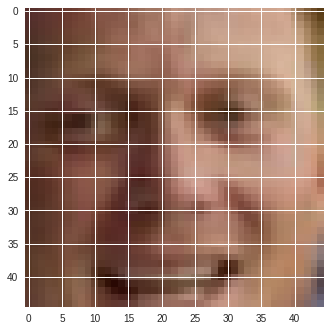

1


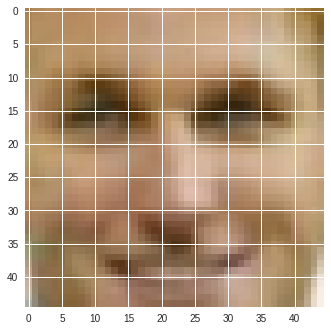

2


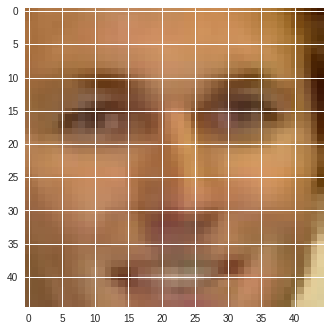

3


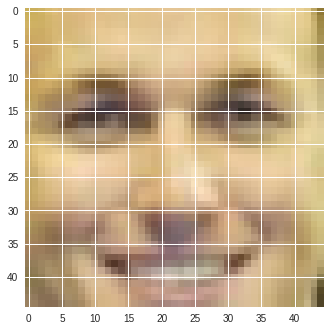

4


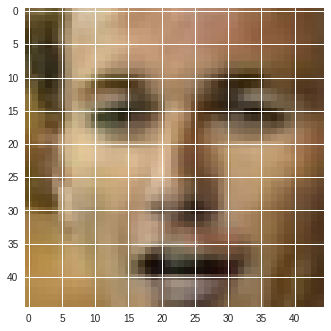

5


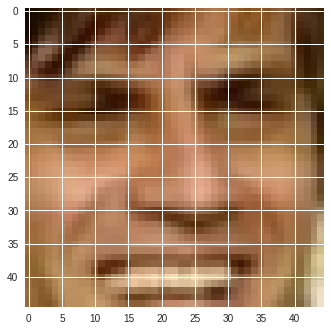

6


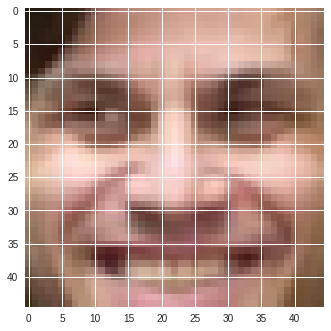

7


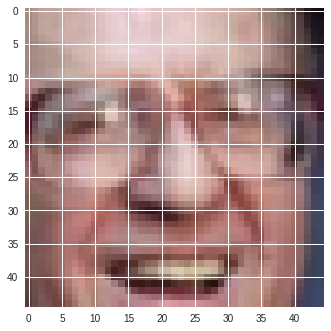

8


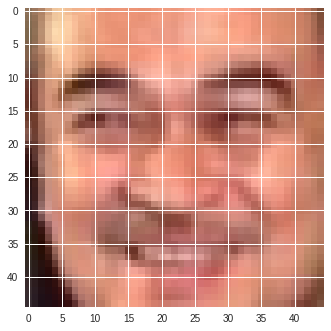

9


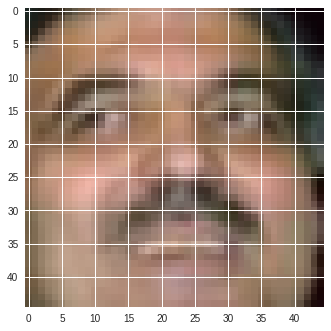

10


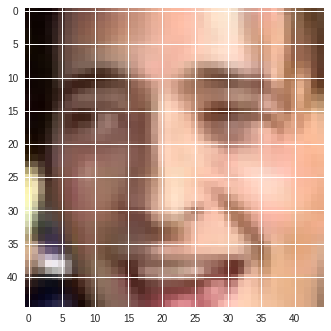

11


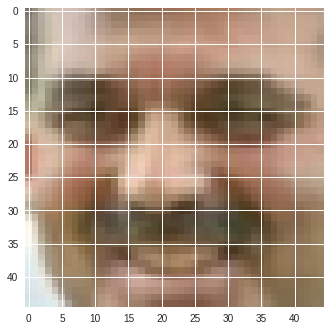

12


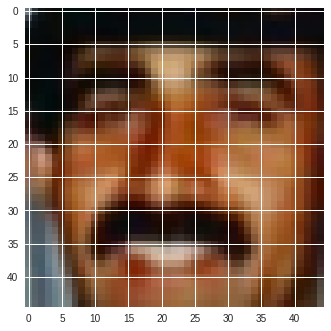

13


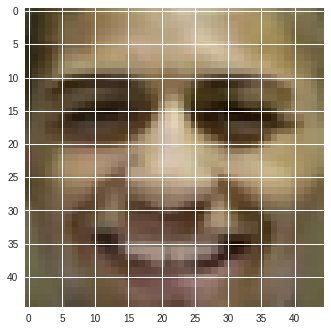

14


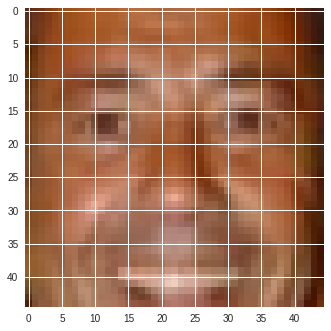

0


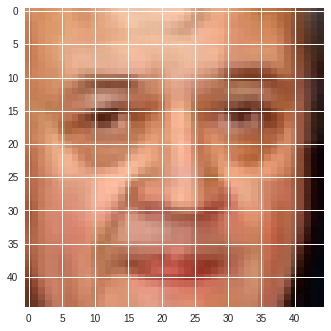

1


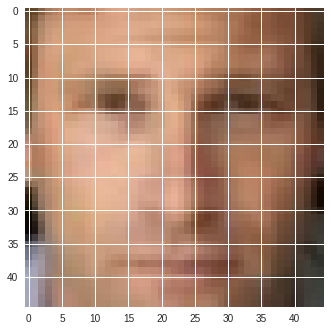

2


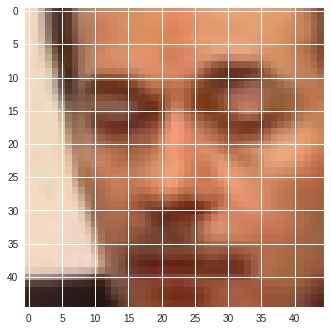

3


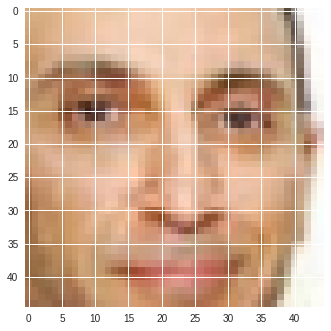

4


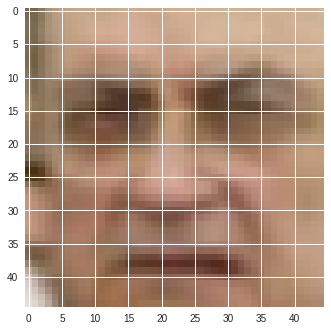

5


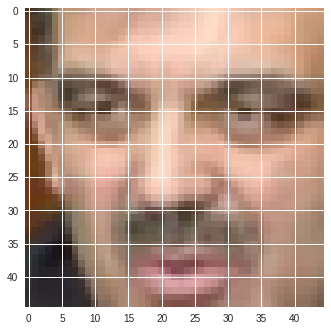

6


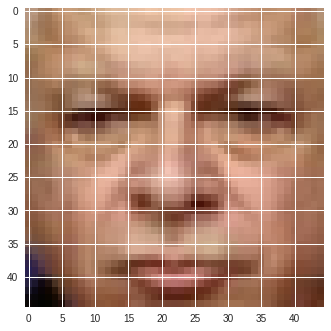

7


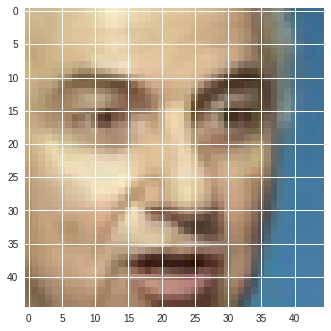

8


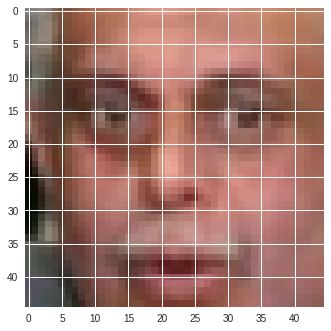

9


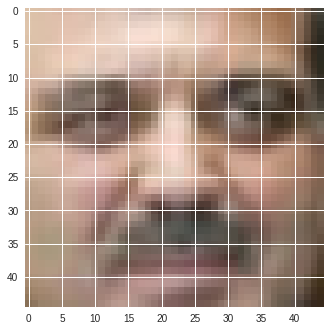

10


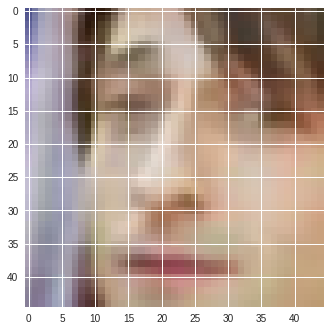

11


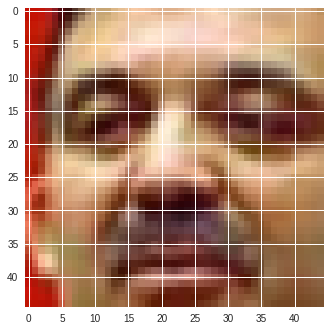

12


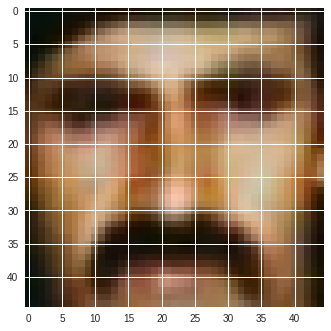

13


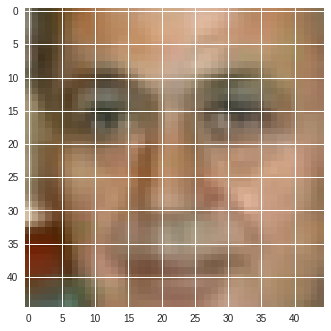

14


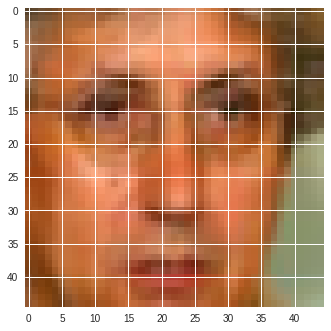

##################################################


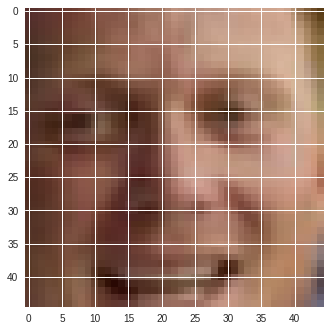

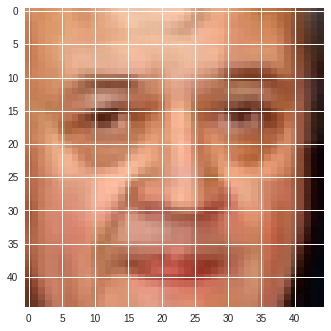

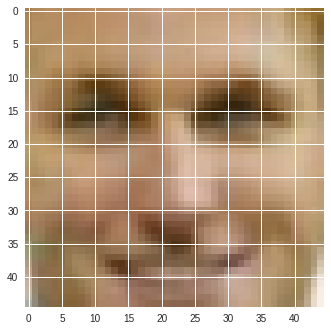

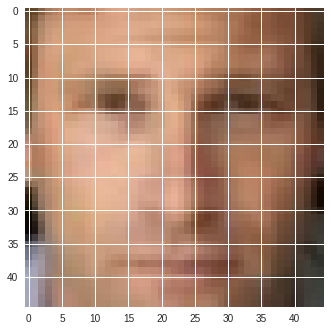

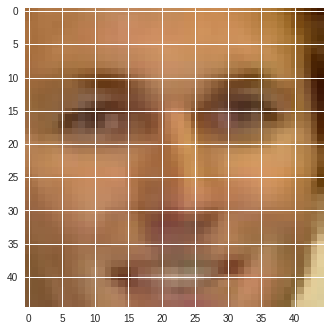

...

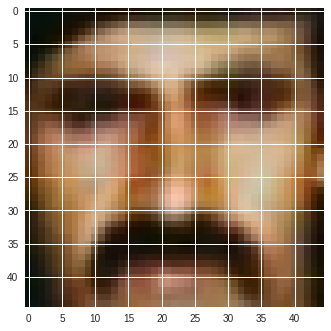

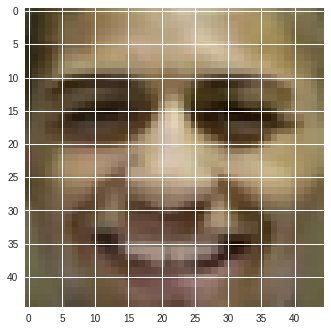

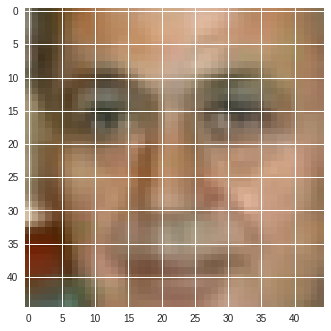

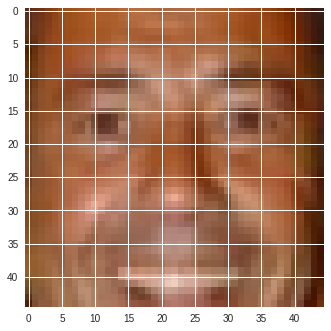

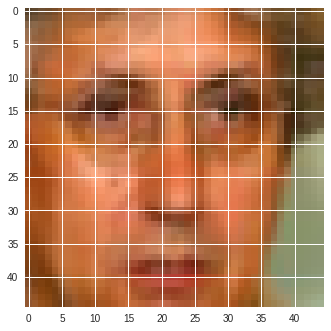

In [137]:
smiling_faces = [1, 3, 4, 5, 6, 8, 9, 11, 26, 31, 101, 34, 58, 60, 83]
sed_faces = [21, 0, 49, 147, 56, 36, 62, 117, 29, 35, 107, 45, 59, 126, 80]

#Подобраны картинки так, чтобы во всем, кроме наличия улыбки, фотографии с соответственными индексами были максимально похожими 

faces = []
for img_name in smiling_faces:
  img = train_ph[img_name]
  faces.append([])
  faces[smiling_faces.index(img_name)].append(img)
v=0
for img_name in sed_faces:
  img = train_ph[img_name]
  faces[sed_faces.index(img_name)].append(img)

#На выходе список пар тензоров-фотографий, отличающихся в основном только тем, что faces[i][0] улыбается, а faces[i][1] - нет  


In [0]:
differences = []
for tnsrs in faces:
  subjs = [cv2.resize(tnsrs[0], (256, 256,)), cv2.resize(tnsrs[1], (256, 256,))] #Меняем размер обоих картинок в паре под вход энкодера
  preds = [encoder.predict(np.expand_dims(subjs[0], 0)), encoder.predict(np.expand_dims(subjs[1], 0))]#Пара представлений этих фотографий - выход энкодера с каждой
  differences += [preds[0] - preds[1]]#Добавляем разности тензоров представлений в список
##################### Считаем средний тензор, который вроде как должен отвечать за улыбку
summ = differences[0]
for i in differences[1:]:
  summ+=i
smile_tnsr = summ / len(differences)

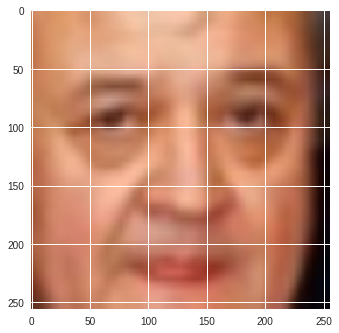

(1, 256, 256, 3)


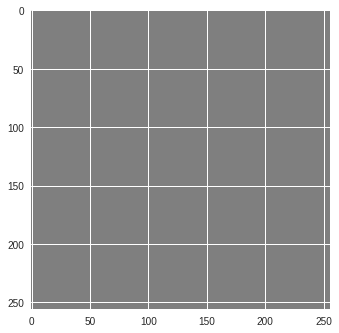

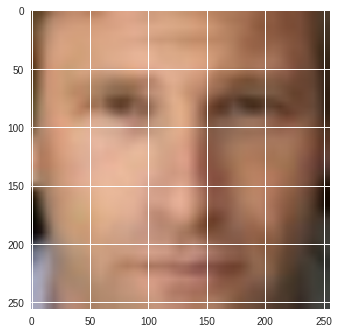

(1, 256, 256, 3)


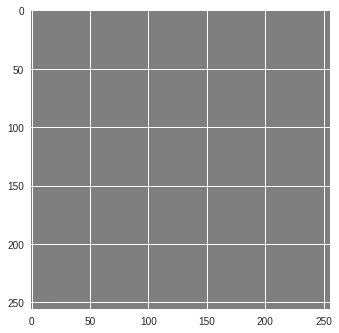

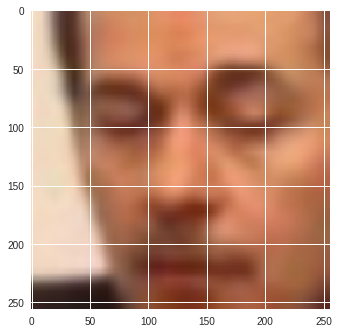

(1, 256, 256, 3)


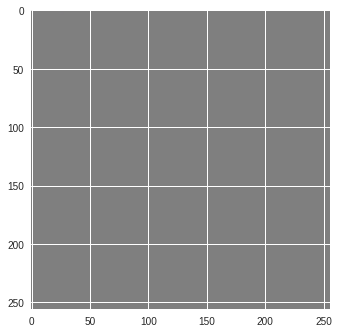

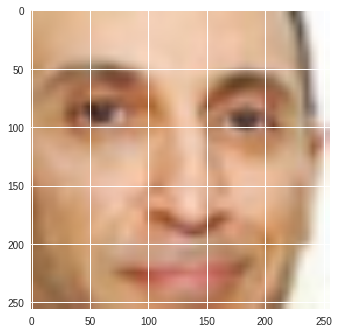

(1, 256, 256, 3)


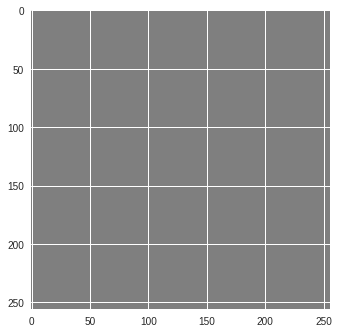

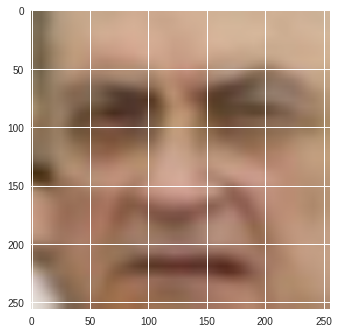

(1, 256, 256, 3)


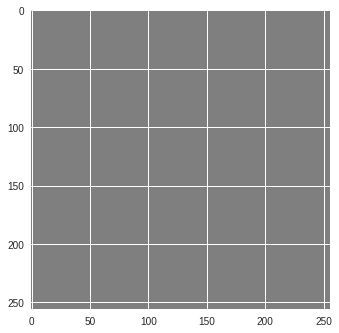

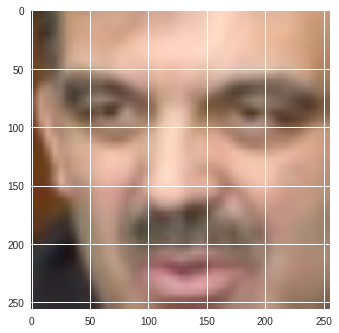

(1, 256, 256, 3)


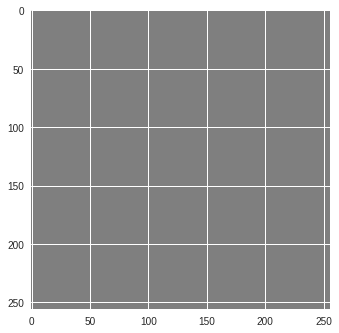

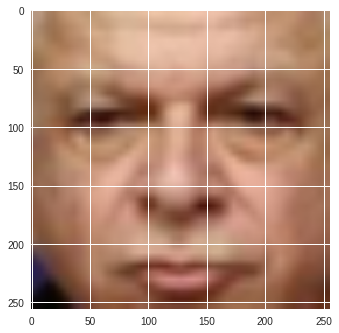

(1, 256, 256, 3)


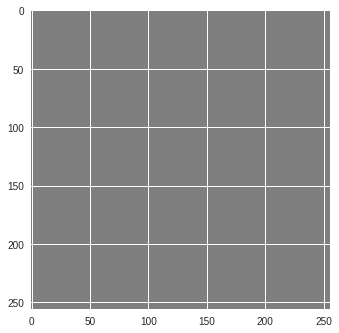

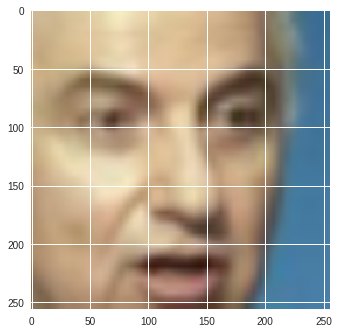

(1, 256, 256, 3)


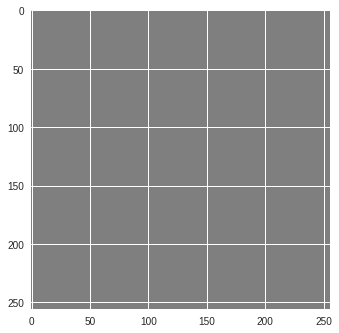

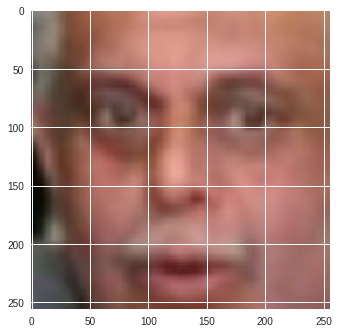

(1, 256, 256, 3)


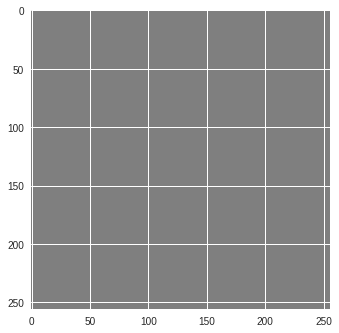

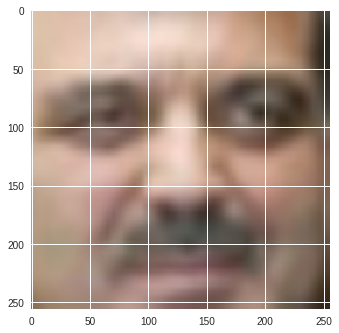

(1, 256, 256, 3)


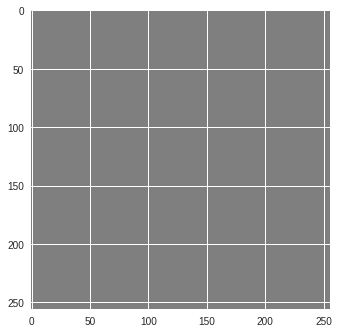

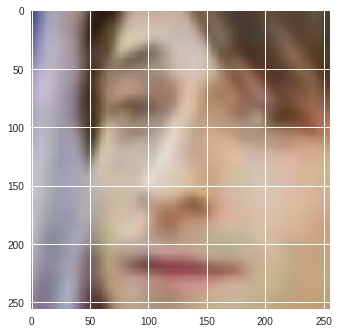

(1, 256, 256, 3)


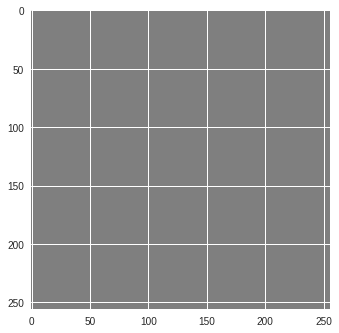

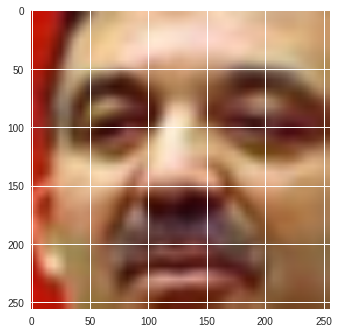

(1, 256, 256, 3)


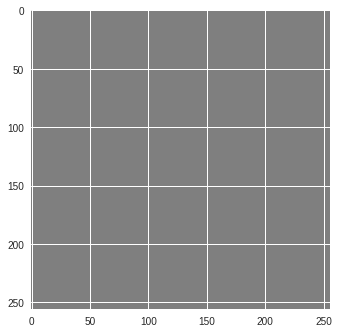

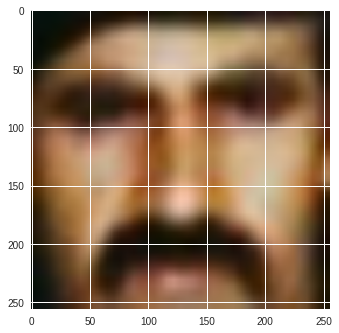

(1, 256, 256, 3)


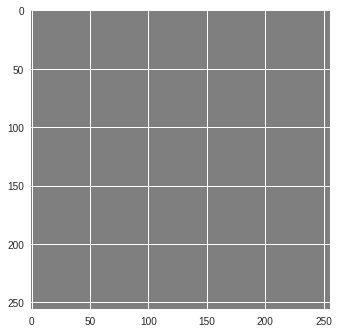

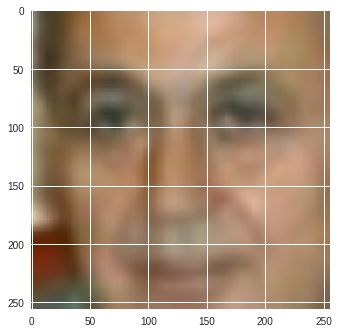

(1, 256, 256, 3)


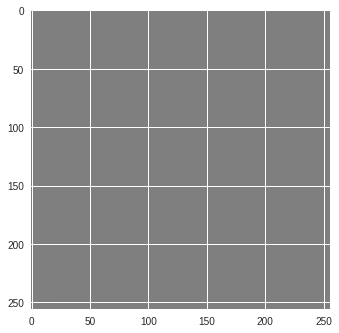

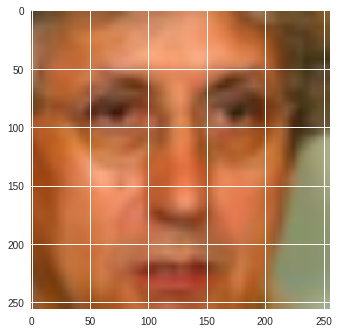

(1, 256, 256, 3)


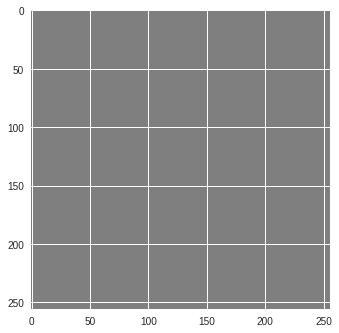

In [158]:
for i in faces:
  plt.imshow(cv2.resize(i[1], (256, 256,)))#Выводим картинку до изменения, чтобы можно было сравнить
  subj = cv2.resize(i[1], (256, 256,))
  pred = encoder.predict(np.expand_dims(subj, 0))#Получаем представление
  pred += smile_tnsr#Прибавляем тензор улыбки
  outp = decoder.predict(pred)#С декодера получаем выход - картинку, надеемся, что с улыбкой
  plt.show()
  print(outp.shape)
  plt.imshow(outp[0])
  plt.show()

RuntimeError: ignored